<a href="https://colab.research.google.com/github/IonaSantana/Artificial-Intelligence/blob/main/Convolutional_Cats_Dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to cute time!
This project classifies images into cats or dogs
With the participation of the cute animals of my colleagues (hint: in the last cell) 

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import cv2
from google.colab.patches import cv2_imshow
tf.__version__

'2.7.0'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path = '/content/drive/MyDrive/VisaoComputacional/Computer Vision Masterclass/Datasets/cat_dog_2.zip'
zip_object = zipfile.ZipFile(file=path, mode='r')
zip_object.extractall('./')
zip_object.close()

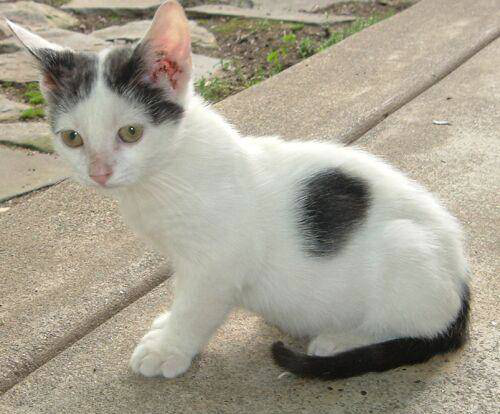

In [ ]:
tf.keras.preprocessing.image.load_img('/content/cat_dog_2/training_set/cat/cat.3.jpg')

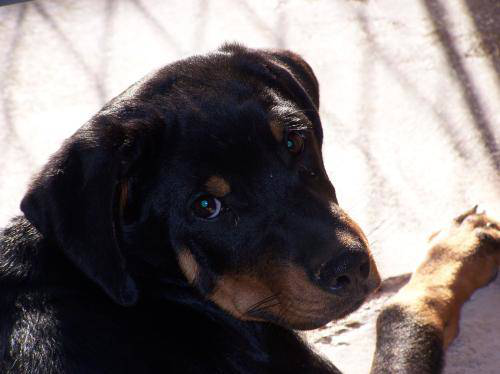

In [ ]:
tf.keras.preprocessing.image.load_img('/content/cat_dog_2/training_set/dog/dog.15.jpg')

Train and Test

In [ ]:
#testar gerando mais e nao gerando
#só coloca os parametros
training_generator = ImageDataGenerator(rescale = 1./255,
                                        rotation_range=7,
                                        horizontal_flip=True,
                                        zoom_range=0.2)

In [ ]:
import os
files = os.listdir('cat_dog_2/training_set/cat')
files2 = os.listdir('cat_dog_2/training_set/dog')
files3 = os.listdir('cat_dog_2/test_set/cat')
files4 = os.listdir('cat_dog_2/test_set/dog')
print(len(files),len(files2), len(files3),len(files4))

2000 2000 500 500


In [ ]:
train_dataset = training_generator.flow_from_directory('/content/cat_dog_2/training_set',
                                                       target_size = (64,64), #maior leva mais tempo
                                                       batch_size = 32, #antes estava 8
                                                       class_mode = 'categorical',
                                                       shuffle = True)

Found 4000 images belonging to 2 classes.


In [ ]:
train_dataset.classes

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [ ]:
train_dataset.class_indices #como ele sabe?

{'cat': 0, 'dog': 1}

In [ ]:
#gerar pro teste e normalizar

test_generator = ImageDataGenerator(rescale=1./255)
test_dataset = test_generator.flow_from_directory('/content/cat_dog_2/test_set',
                                                  target_size = (64,64),
                                                  batch_size = 1, #tava 32, mas é um por um
                                                  class_mode = 'categorical',
                                                  shuffle = False)

Found 1000 images belonging to 2 classes.


In [ ]:
(64 * 64 * 3 + 2) / 2

6145.0

In [ ]:
from tensorflow.python.keras.layers.pooling import MaxPool2D
network = Sequential()
network.add(Conv2D(32, (3,3), input_shape = (64,64,3), activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(32, (3,3), activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))


network.add(Flatten())

network.add(Dense(units = 3137, activation='relu'))
network.add(Dense(units = 3137, activation='relu'))
network.add(Dense(units = 2, activation='softmax')) 
network.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 6272)              0         
                                                                 
 dense_6 (Dense)             (None, 3137)             

flatten = 6272

In [ ]:
(6272 + 2)/2

3137.0

In [ ]:
network.compile(optimizer='Adam', loss='categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
history = network.fit_generator(train_dataset, epochs=15, validation_data=test_dataset)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


Epoch 1/15
125/125 [==============================] - 107s 850ms/step - loss: 0.3059 - accuracy: 0.8698 - val_loss: 0.5921 - val_accuracy: 0.7650
Epoch 2/15
125/125 [==============================] - 90s 715ms/step - loss: 0.2772 - accuracy: 0.8813 - val_loss: 0.5777 - val_accuracy: 0.7750
Epoch 3/15
125/125 [==============================] - 82s 653ms/step - loss: 0.2566 - accuracy: 0.8963 - val_loss: 0.6075 - val_accuracy: 0.7680
Epoch 4/15
125/125 [==============================] - 83s 661ms/step - loss: 0.2471 - accuracy: 0.8957 - val_loss: 0.7264 - val_accuracy: 0.7340
Epoch 5/15
125/125 [==============================] - 80s 641ms/step - loss: 0.2335 - accuracy: 0.9082 - val_loss: 0.6352 - val_accuracy: 0.7920
Epoch 6/15
125/125 [==============================] - 80s 642ms/step - loss: 0.2165 - accuracy: 0.9170 - val_loss: 0.7196 - val_accuracy: 0.7630
Epoch 7/15
125/125 [==============================] - 80s 642ms/step - loss: 0.1953 - accuracy: 0.9222 - val_loss: 0.7774 - val_a

Validar a Rede Neural

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

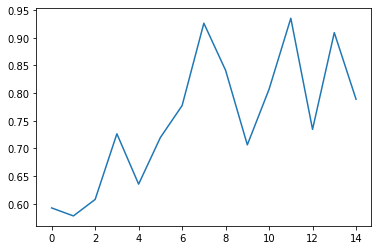

In [ ]:
plt.plot(history.history['val_loss'])

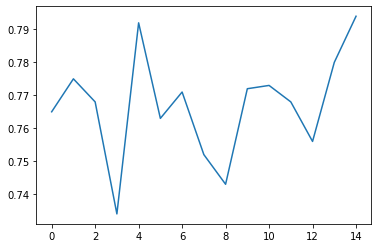

In [ ]:
plt.plot(history.history['val_accuracy']);

In [ ]:
test_dataset.class_indices

{'cat': 0, 'dog': 1}

In [ ]:
predictions = network.predict(test_dataset)
#predictions

In [ ]:
predictions = np.argmax(predictions, axis = 1)
#predictions

In [ ]:
test_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
#import de metricas
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
#salvar modelo
from keras.models import save_model

In [ ]:
accuracy_score(test_dataset.classes, predictions)

0.794

In [ ]:
test_dataset.class_indices

{'cat': 0, 'dog': 1}

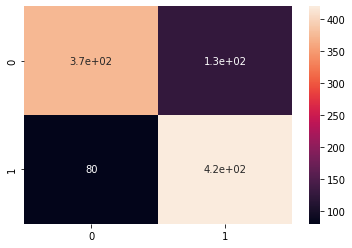

In [ ]:
cm = confusion_matrix(test_dataset.classes, predictions)
sns.heatmap(cm, annot = True)

In [ ]:
print(classification_report(test_dataset.classes, predictions))

              precision    recall  f1-score   support

           0       0.82      0.75      0.78       500
           1       0.77      0.84      0.80       500

    accuracy                           0.79      1000
   macro avg       0.80      0.79      0.79      1000
weighted avg       0.80      0.79      0.79      1000



Salvar e Carregar o modelo

In [ ]:
model_json = network.to_json()
with open('network.json', 'w') as json_file:
  json_file.write(model_json)

In [ ]:
network_saved = save_model(network, 'content/weightcatdog_1conv.hdf5')

In [ ]:
with open('network.json', 'r') as json_file:
  json_saved_model = json_file.read()
json_saved_model  

'{"class_name": "Sequential", "config": {"name": "sequential_2", "layers": [{"class_name": "InputLayer", "config": {"batch_input_shape": [null, 64, 64, 3], "dtype": "float32", "sparse": false, "ragged": false, "name": "conv2d_5_input"}}, {"class_name": "Conv2D", "config": {"name": "conv2d_5", "trainable": true, "batch_input_shape": [null, 64, 64, 3], "dtype": "float32", "filters": 32, "kernel_size": [3, 3], "strides": [1, 1], "padding": "valid", "data_format": "channels_last", "dilation_rate": [1, 1], "groups": 1, "activation": "relu", "use_bias": true, "kernel_initializer": {"class_name": "GlorotUniform", "config": {"seed": null}}, "bias_initializer": {"class_name": "Zeros", "config": {}}, "kernel_regularizer": null, "bias_regularizer": null, "activity_regularizer": null, "kernel_constraint": null, "bias_constraint": null}}, {"class_name": "MaxPooling2D", "config": {"name": "max_pooling2d_5", "trainable": true, "dtype": "float32", "pool_size": [2, 2], "padding": "valid", "strides": [2

In [ ]:
network_loaded = tf.keras.models.model_from_json(json_saved_model)
network_loaded.load_weights('/content/content/weightcatdog_1conv.hdf5')
network_loaded.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics= ['accuracy'])

In [ ]:
network_loaded.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 6272)              0         
                                                                 
 dense_6 (Dense)             (None, 3137)             

Classificar uma imagem

Funções

In [269]:
#Função ver imagens

def image_view(path):
  image = cv2.imread(path)
  try:
    imageview = cv2.resize(image, (512,512))  
    image = cv2.resize(image, (64,64))
  except:
    return None
  image = image / 255
  image = image.reshape(-1, 64, 64, 3)
  return {'image_process': image, 'image_view': imageview}

In [270]:
#carregar modelo
def classification(image, imageview):  
  result = network_loaded(image)
  result = np.argmax(result)
  if result == 0:
    resposta = 'Eu acho que vi um gatinho'
  else:
    resposta = 'Olha que catiorinho mais lindo'
  x,y,w,h = 0,0,512,45
  cv2.rectangle(imageview, (x, x), (x + w, y + h), (0,0,0), -1)
  cv2.putText(imageview, resposta, (x + int(w/10),y + int(h/2)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (200,100,200),1)
  cv2_imshow(imageview)

In [271]:
path = '/content/cat_dog_2/test_set/cat/cat.3510.jpg'
image = image_view(path)

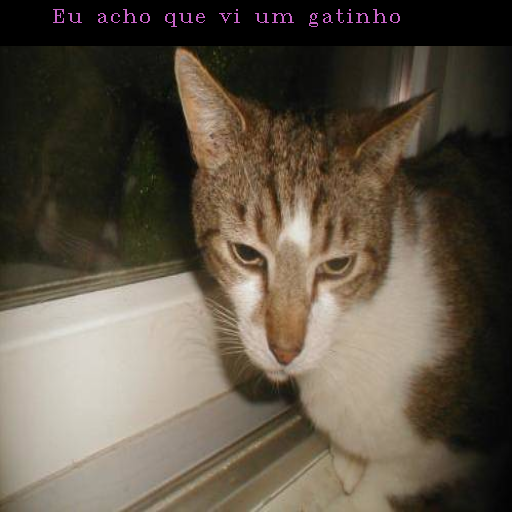

In [272]:
classification(image['image_process'], image['image_view'])

Explosão de fofura

In [273]:
path = '/content/drive/MyDrive/VisaoComputacional/Computer Vision Masterclass/Datasets/Bichinhos.zip'
zip_object = zipfile.ZipFile(file=path, mode='r')
zip_object.extractall('./')
zip_object.close()

In [274]:
import os
files = os.listdir('./Bichinhos')

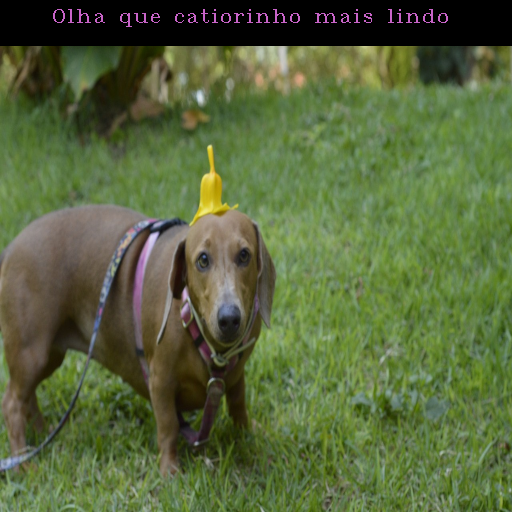

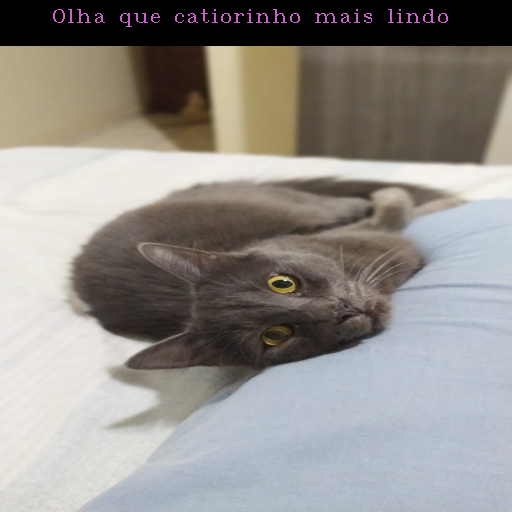

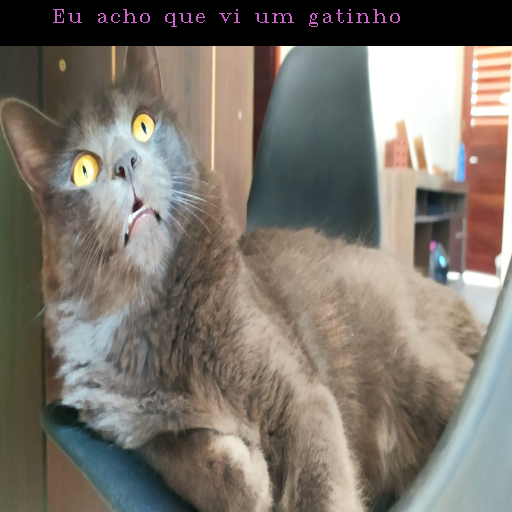

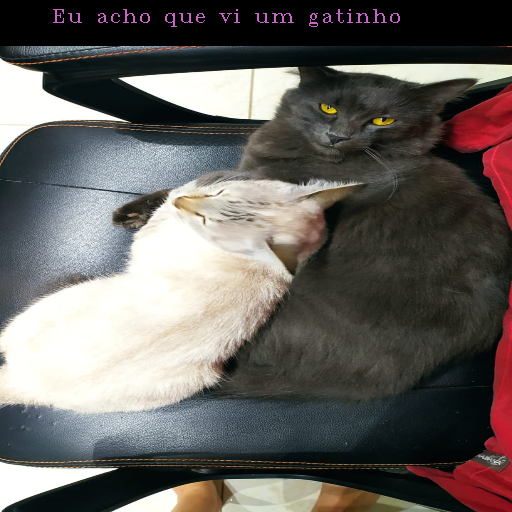

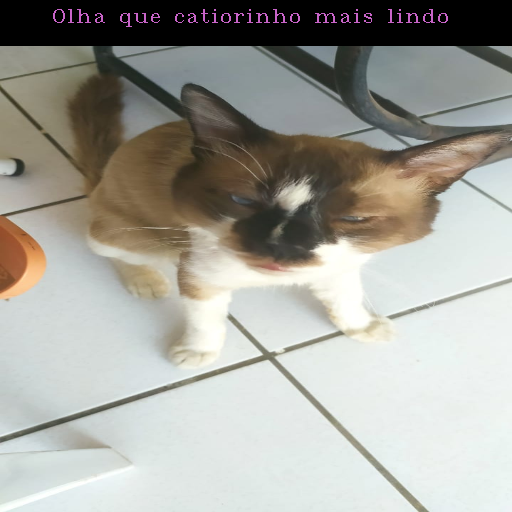

...

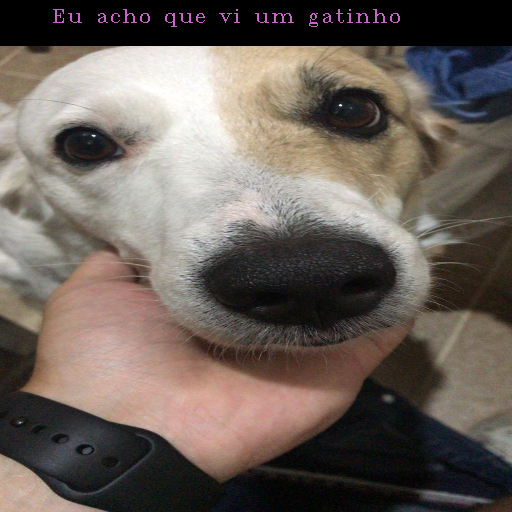

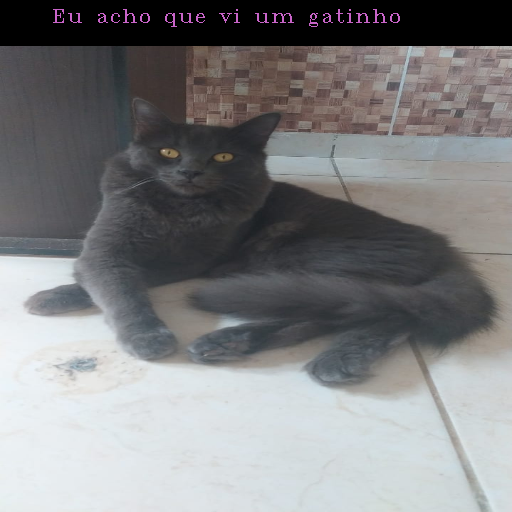

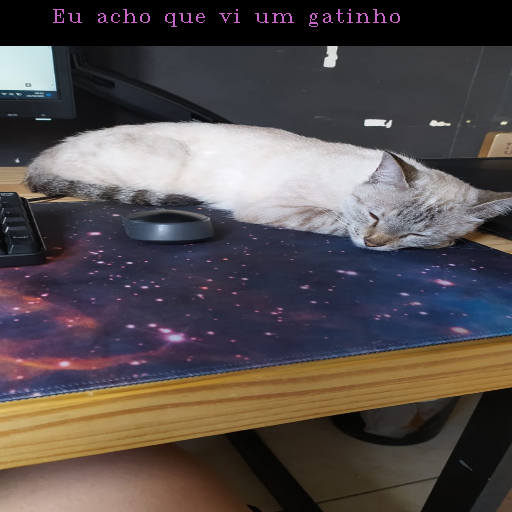

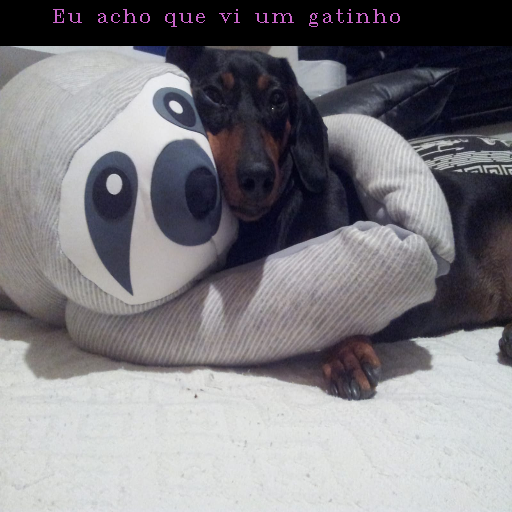

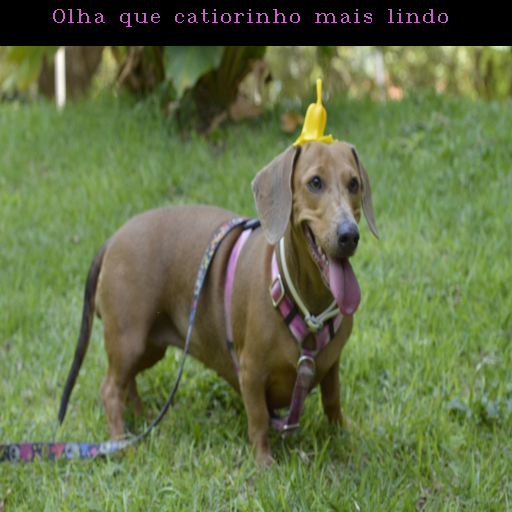




imagem corrompida





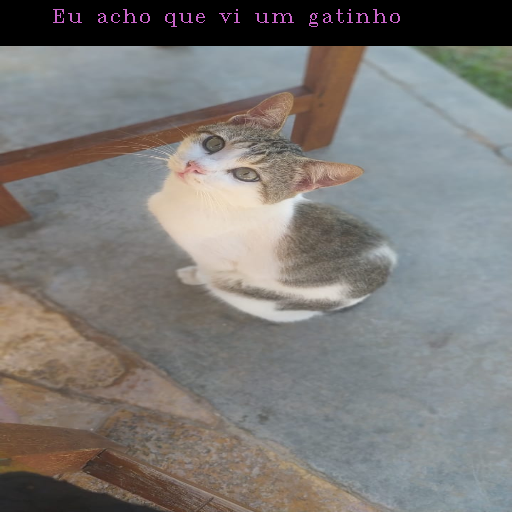

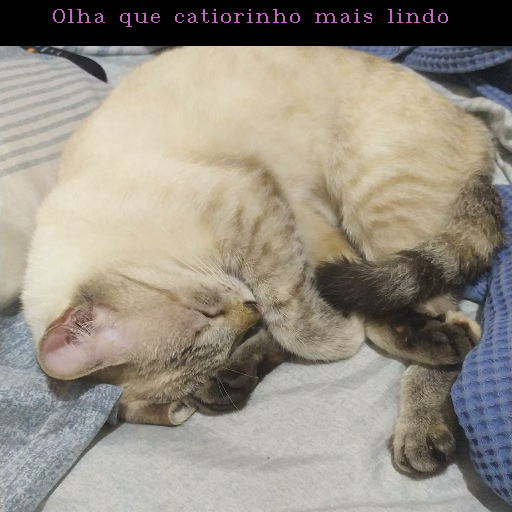

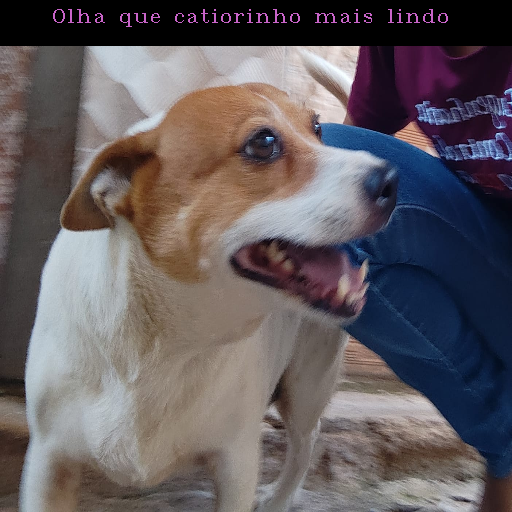

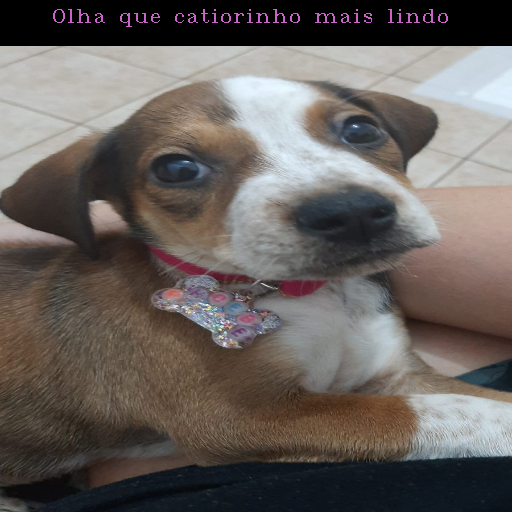

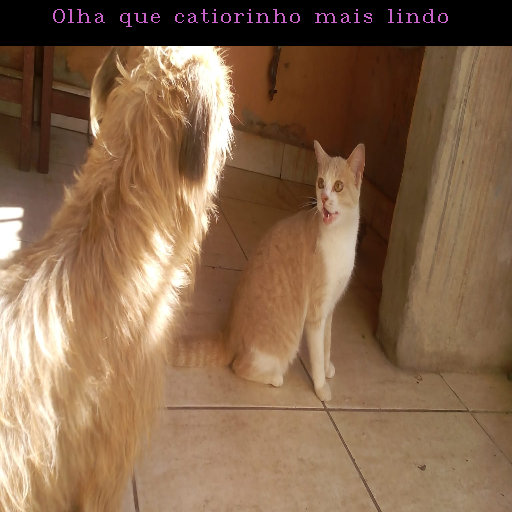

...

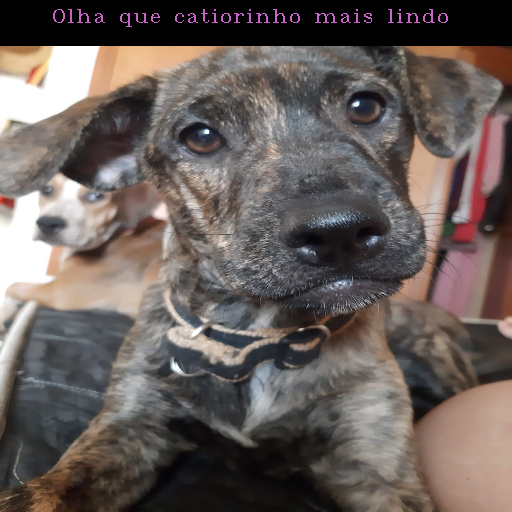

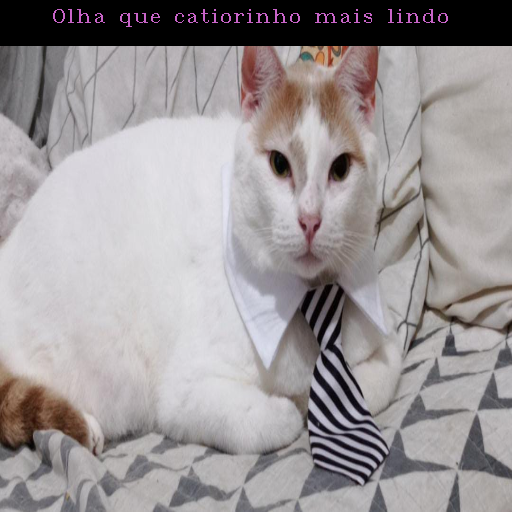

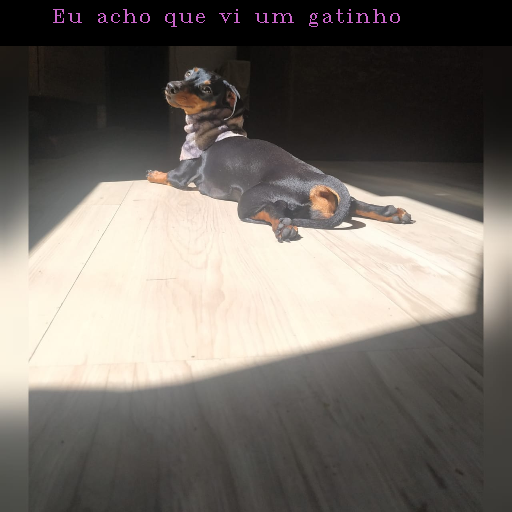

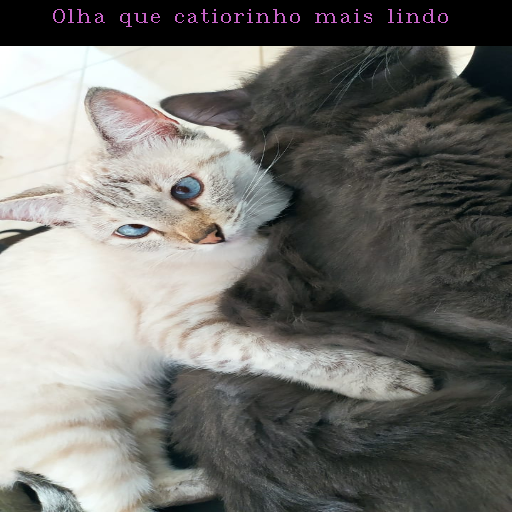

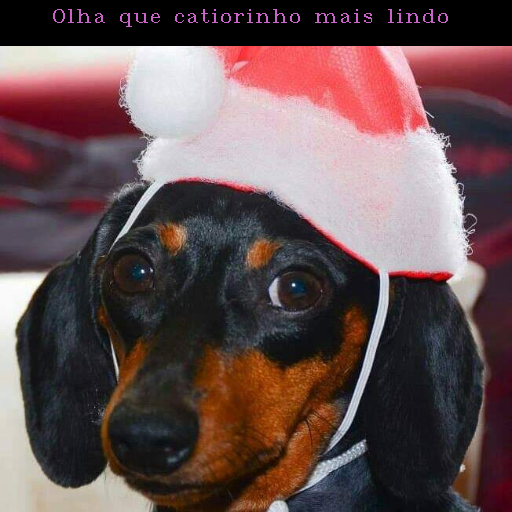




imagem corrompida





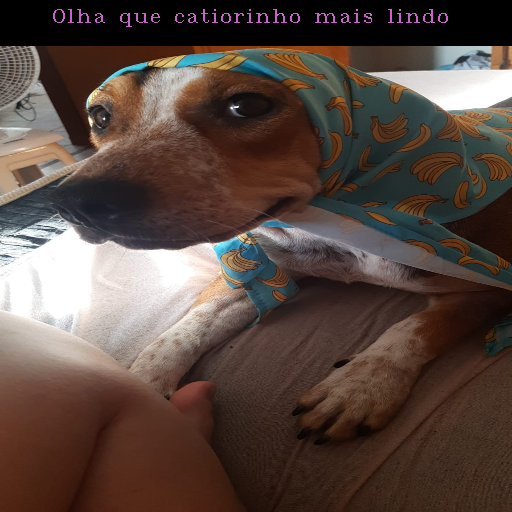

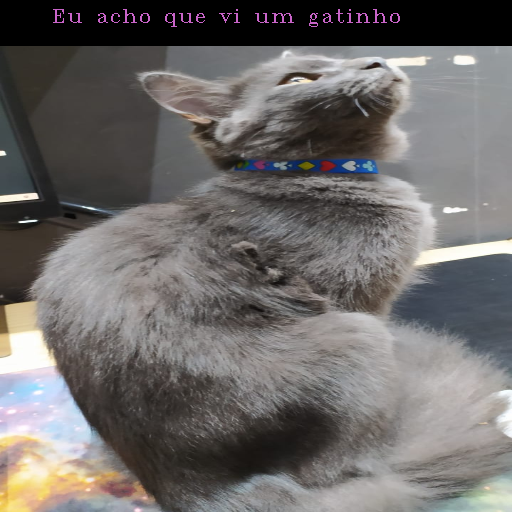

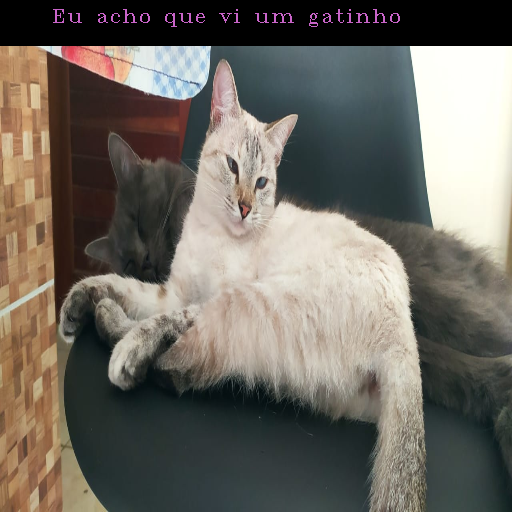

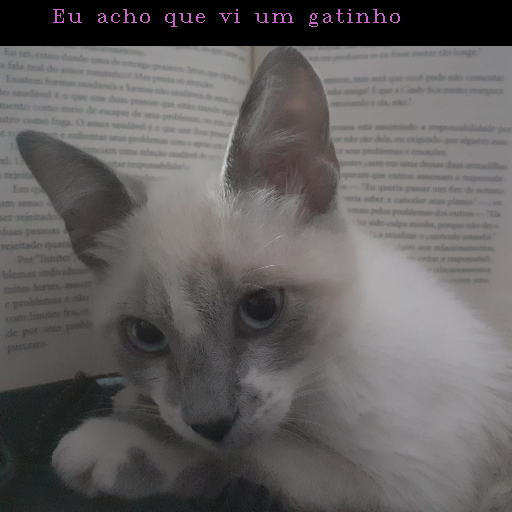

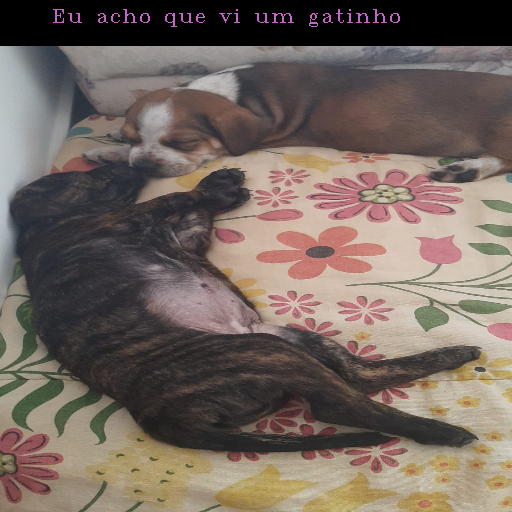

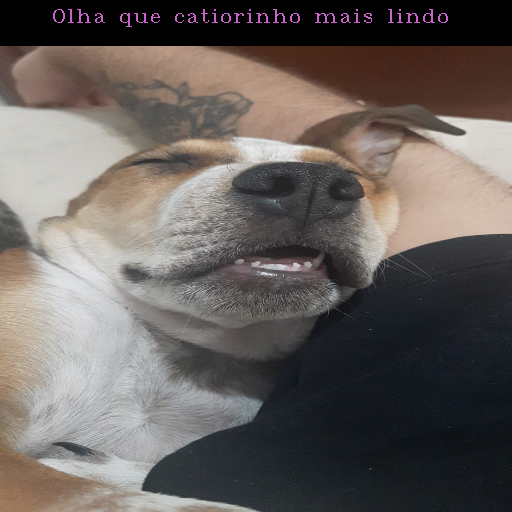




imagem corrompida



imagem corrompida





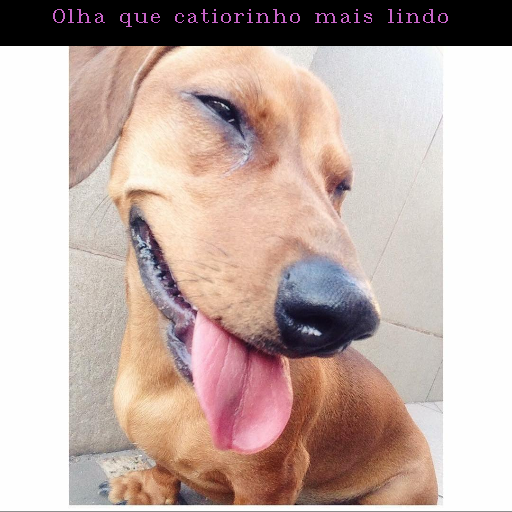

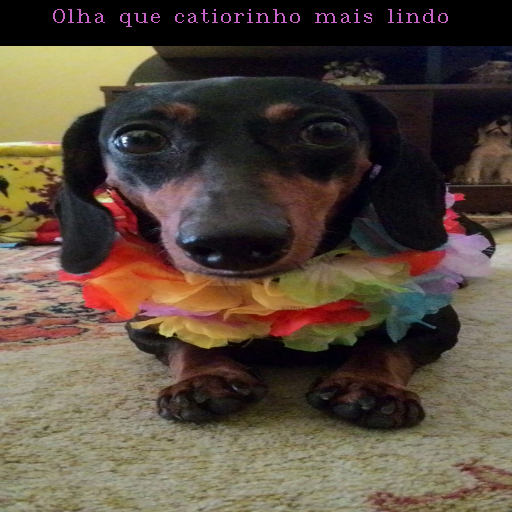

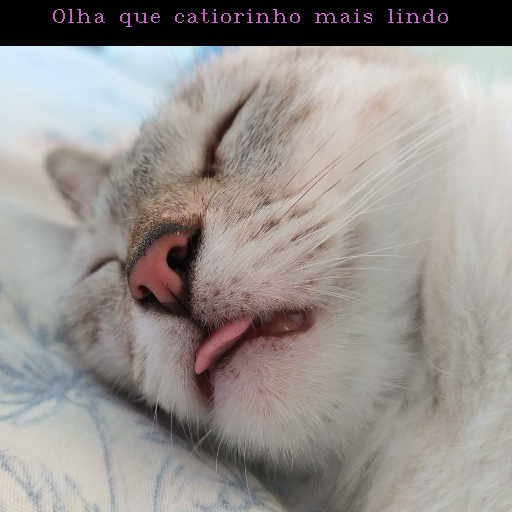

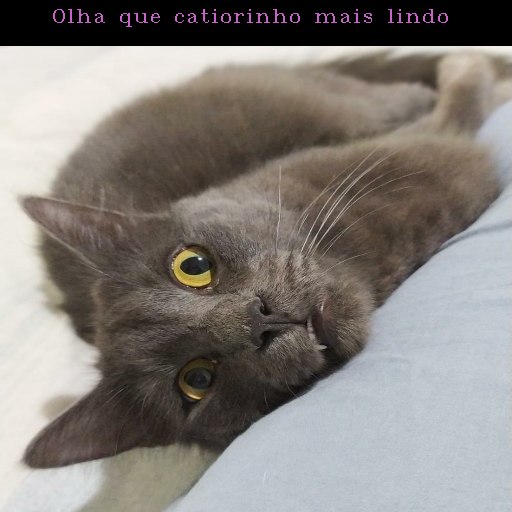

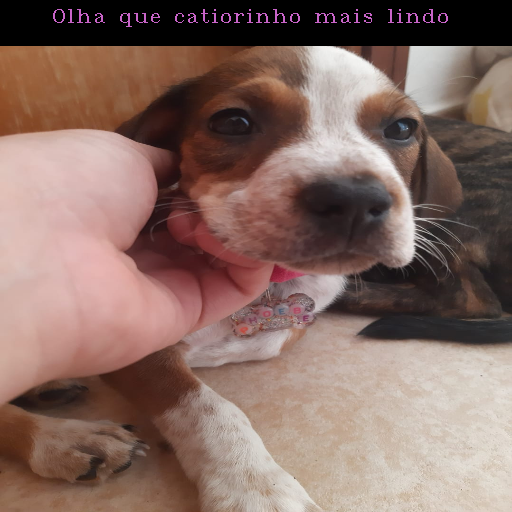

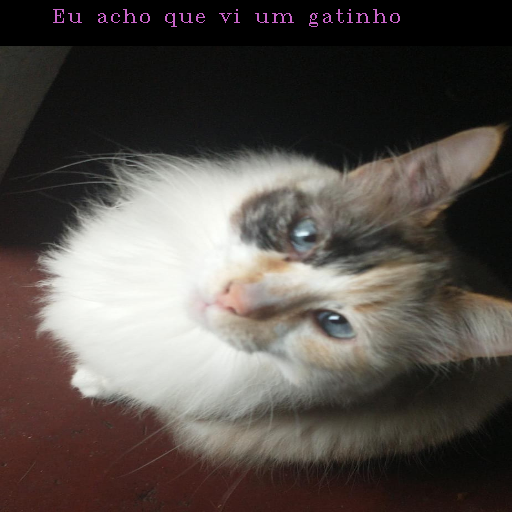

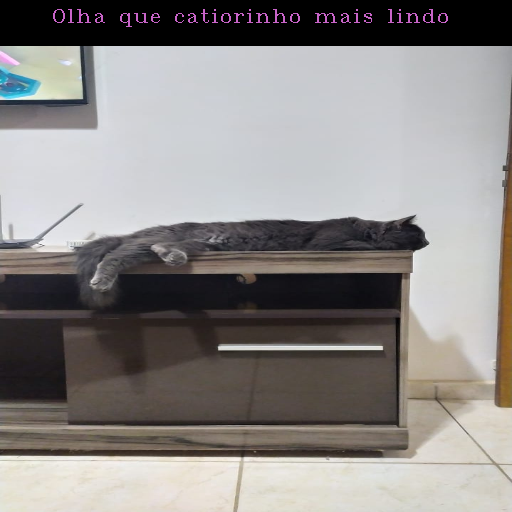

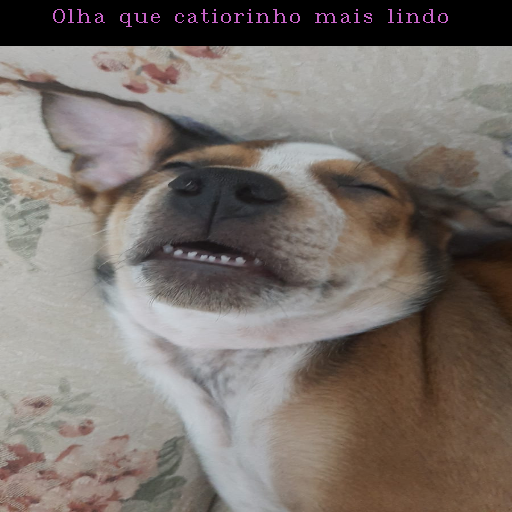

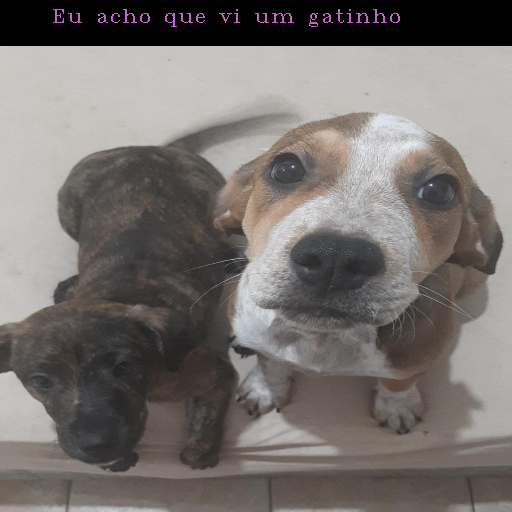

In [276]:
for img in files:
  if(img.startswith('B')):
    path = "./Bichinhos/" + img
    image = image_view(path)
    print('\n\n')
    if image is None:
      print('imagem corrompida')
    else:
      classification(image['image_process'], image['image_view'])